<a href="https://colab.research.google.com/github/ArthurCaixet0/ArthurCaixeta0/blob/main/Processamento_Imagens.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import files
uploaded=files.upload()
print(uploaded)

Saving img.png to img.png
{'img.png': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x04\x00\x00\x00\x06\x00\x08\x02\x00\x00\x00g\xe0\xad\xfd\x00\x00\xe7\x8dcaBX\x00\x00\xe7\x8djumb\x00\x00\x00\x1ejumdc2pa\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa\x00\x00\x007\x13jumb\x00\x00\x00Gjumdc2ma\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03urn:c2pa:28585aab-6f62-402b-b43b-7e16c33b2f1d\x00\x00\x00\x01\xe1jumb\x00\x00\x00)jumdc2as\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa.assertions\x00\x00\x00\x01\x05jumb\x00\x00\x00)jumdcbor\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa.actions.v2\x00\x00\x00\x00\xd4cbor\xa1gactions\x82\xa3factionlc2pa.createdmsoftwareAgent\xbfdnamefGPT-4o\xffqdigitalSourceTypexFhttp://cv.iptc.org/newscodes/digitalsourcetype/trainedAlgorithmicMedia\xa2factionnc2pa.convertedmsoftwareAgent\xbfdnamejOpenAI API\xff\x00\x00\x00\xabjumb\x00\x00\x00(jumdcbor\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa.hash.data\x00\x00\x00\x00{cbor\xa5jexclusions\x81\xa2esta

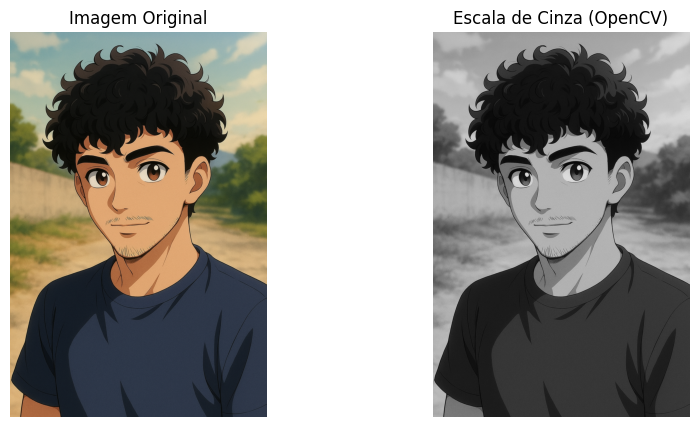

In [8]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Lê a imagem com OpenCV - ele carrega no formato BGR (Azul, Verde, Vermelho) em vez de RGB!
img = cv2.imread('img.png')

# Converte BGR (padrão do OpenCV) para RGB (padrão do matplotlib)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Exibe a imagem original
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) # (linhas, colunas, posição)
plt.imshow(img_rgb)  # Mostra a imagem colorida
plt.title("Imagem Original")
plt.axis('off')

# Converte para escala de cinza com OpenCV
gray_cv2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Exibe a imagem em cinza
plt.subplot(1, 2, 2)
plt.imshow(gray_cv2, cmap='gray') # 'cmap' define o mapa de cores como cinza
plt.title("Escala de Cinza (OpenCV)")
plt.axis('off')

plt.show()

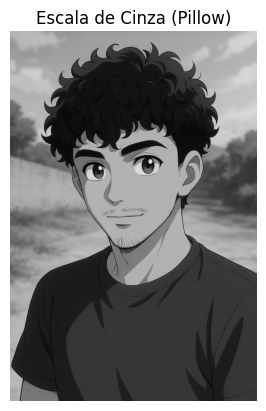

In [9]:
# Abre a imagem com Pillow - ele já carrega no formato RGB correto!
img_pil = Image.open('img.png')  # Mesmo nome do arquivo

# Converte para escala de cinza
# 'L' significa Luminance (luminância), que é escala de cinza
gray_pil = img_pil.convert('L')

# Exibe a imagem
plt.imshow(gray_pil, cmap='gray')
plt.title("Escala de Cinza (Pillow)")
plt.axis('off')
plt.show()

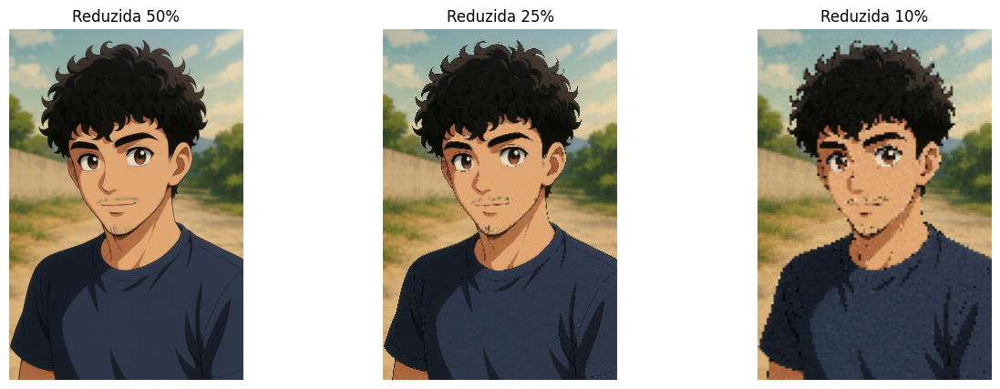

In [10]:
# EXERCÍCIO 1 - REDIMENSIONAMENTO

# Carrega a imagem
img = cv2.imread(list(uploaded.keys())[0])
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Redimensionamentos para 50%, 25% e 10%
redimensionamentos = [0.5, 0.25, 0.1]
nomes = ['50%', '25%', '10%']

plt.figure(figsize=(15, 5))

for i, escala in enumerate(redimensionamentos):
    largura = int(img.shape[1] * escala)
    altura = int(img.shape[0] * escala)

    img_red = cv2.resize(img, (largura, altura))
    img_red_rgb = cv2.cvtColor(img_red, cv2.COLOR_BGR2RGB)

    plt.subplot(1, len(redimensionamentos), i+1)
    plt.imshow(img_red_rgb)
    plt.title(f'Reduzida {nomes[i]}')
    plt.axis('off')

    cv2.imwrite(f'imagem_{nomes[i]}.jpg', img_red)

plt.show()

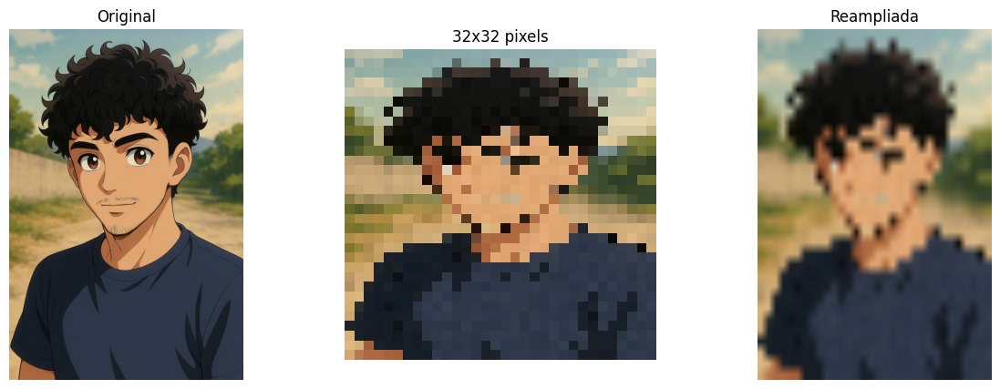

True

In [11]:
# EXERCÍCIO 2 - AMOSTRAGEM

# Baixa resolução (32x32)
img_32x32 = cv2.resize(img, (32, 32))

# Reamplia para tamanho original
img_reampliada = cv2.resize(img_32x32, (img.shape[1], img.shape[0]))

# Comparação
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img_32x32, cv2.COLOR_BGR2RGB))
plt.title('32x32 pixels')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(img_reampliada, cv2.COLOR_BGR2RGB))
plt.title('Reampliada')
plt.axis('off')

plt.show()

# Salva
cv2.imwrite('baixa_resolucao.jpg', img_32x32)
cv2.imwrite('reampliada.jpg', img_reampliada)

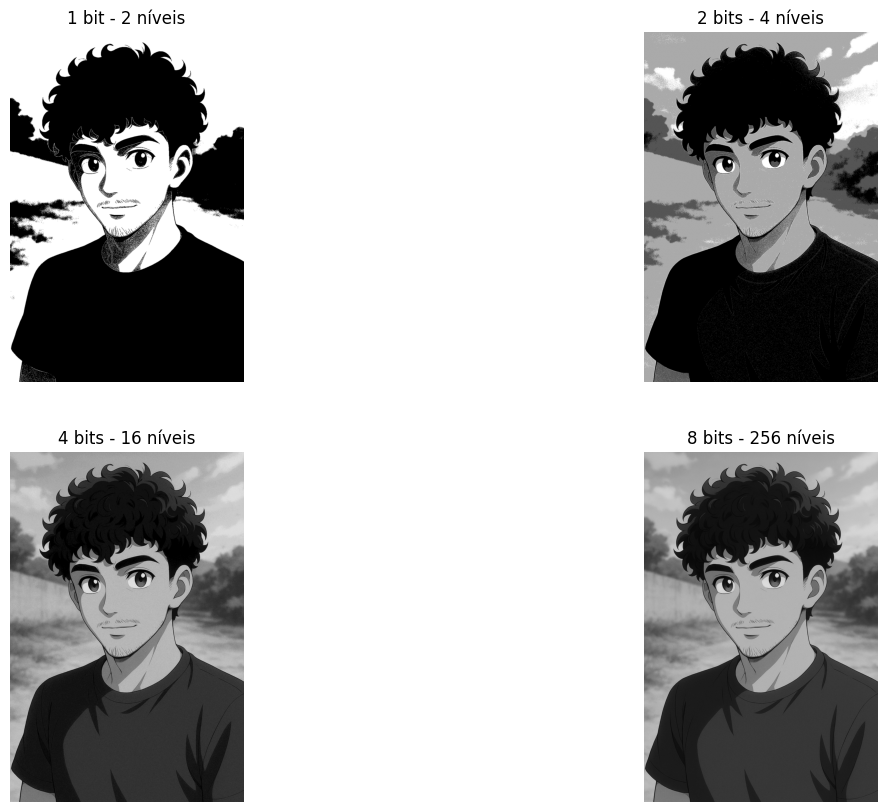

In [12]:
# EXERCÍCIO 3 - QUANTIZAÇÃO

# Converte para cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Níveis de quantização
niveis = [2, 4, 16, 256]
nomes = ['1 bit', '2 bits', '4 bits', '8 bits']

plt.figure(figsize=(15, 10))

for i, n in enumerate(niveis):
    # Quantiza
    if n < 256:
        step = 256 // n
        img_quant = (gray // step) * step
    else:
        img_quant = gray.copy()

    # Exibe
    plt.subplot(2, 2, i+1)
    plt.imshow(img_quant, cmap='gray')
    plt.title(f'{nomes[i]} - {n} níveis')
    plt.axis('off')

    # Salva
    cv2.imwrite(f'quantizacao_{nomes[i]}.jpg', img_quant)

plt.show()

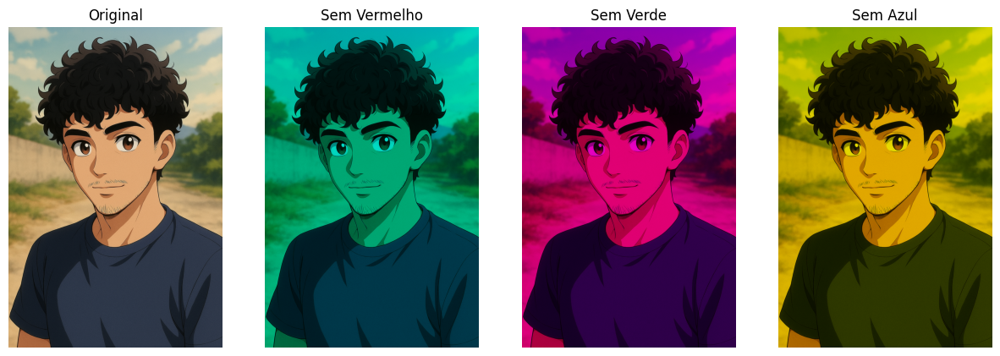

True

In [13]:
# EXERCÍCIO 4 - REMOÇÃO DE CANAIS DE COR

# Cria cópias para manipular
img_sem_R = img.copy()
img_sem_G = img.copy()
img_sem_B = img.copy()

# Remove canais (OpenCV usa BGR!)
img_sem_R[:, :, 2] = 0  # Remove Vermelho (canal 2)
img_sem_G[:, :, 1] = 0  # Remove Verde (canal 1)
img_sem_B[:, :, 0] = 0  # Remove Azul (canal 0)

# Converte para RGB para exibição
img_sem_R_rgb = cv2.cvtColor(img_sem_R, cv2.COLOR_BGR2RGB)
img_sem_G_rgb = cv2.cvtColor(img_sem_G, cv2.COLOR_BGR2RGB)
img_sem_B_rgb = cv2.cvtColor(img_sem_B, cv2.COLOR_BGR2RGB)

# Exibe
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(img_sem_R_rgb)
plt.title('Sem Vermelho')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(img_sem_G_rgb)
plt.title('Sem Verde')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(img_sem_B_rgb)
plt.title('Sem Azul')
plt.axis('off')

plt.show()

# Salva
cv2.imwrite('sem_vermelho.jpg', img_sem_R)
cv2.imwrite('sem_verde.jpg', img_sem_G)
cv2.imwrite('sem_azul.jpg', img_sem_B)

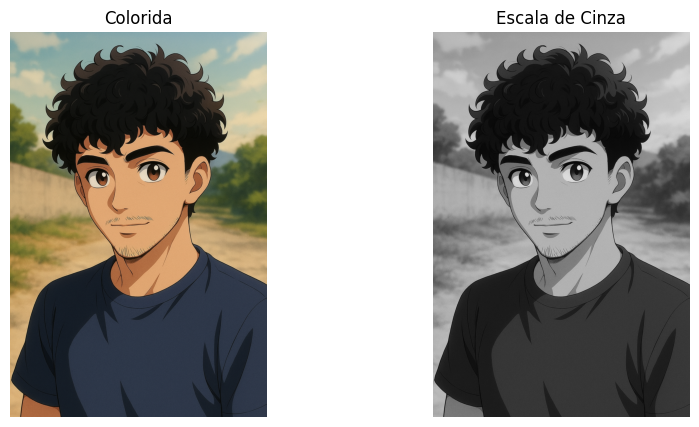

Tamanho da imagem colorida: 638485 bytes
Tamanho da imagem em cinza: 598871 bytes
Economia de: 39614 bytes


In [14]:
# EXERCÍCIO 5 - ESCALA DE CINZA

import os
import cv2
import matplotlib.pyplot as plt

# Converte para cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Exibe
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Colorida')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray, cmap='gray')
plt.title('Escala de Cinza')
plt.axis('off')

plt.show()

# Salva e compara tamanhos
cv2.imwrite('colorida.jpg', img)
cv2.imwrite('cinza.jpg', gray)

colorida_size = os.path.getsize('colorida.jpg')
cinza_size = os.path.getsize('cinza.jpg')

print(f'Tamanho da imagem colorida: {colorida_size} bytes')
print(f'Tamanho da imagem em cinza: {cinza_size} bytes')
print(f'Economia de: {colorida_size - cinza_size} bytes')